# Analysis of hippocampal theta sweeps

***Sidney Rafilson | Buzsaki Lab***

This notebook is the precursor to bilat_theta_sweeps.
The code here works for multi-region recordings in one hemisphere, loading the preprocessed electrophysiology (CatGT -> Kilosort4 -> CellMetrics) and tracking data,
building spike rate matrices and place fields and bayessian decoding.

Especially useful for the analysis of the Use Dependent Sleep (UDS) experiments

In [1]:
import numpy as np
import pandas as pd

from tqdm import tqdm

from scipy.stats import zscore
from scipy.interpolate import interp1d
from scipy.io import loadmat
from scipy.special import logsumexp

import matplotlib.pyplot as plt
import seaborn as sns
sns.set_context('notebook', font_scale=1.5)
import plotly.graph_objects as go

from core import *

## Pipeline configuration settings

In [3]:
# ----------------------------- Config ---------------------------------

# Data paths and session info
DATA_DIR = r"\\research-cifs.nyumc.org\research\buzsakilab\Homes\voerom01\Use_dependent_sleep\UDS_R01\UDS_R01_20250212"
SESSION_NAME = "pre_homecage_g0"
PROBES = [0, 1, 2]


# Spike rate computation parameters
WINDOW_SIZE = 0.04          # s
STEP_SIZE   = 0.04        # s
SIGMA       = 12.5          # smoothing sigma (0 -> no smoothing)
USE_UNITS   = "good"       # {'all', 'good', 'mua'}
NORMALIZE   = True         # z-score each unit's rates

# Filtering thresholds
MIN_TOTAL_SPIKES   = 100
MIN_MEAN_RATE_HZ   = 0.01
MIN_PRESENCE_RATIO = 0.25
N_TIME_BINS        = 100    # coarse bins for presence ratio


# defining the region dictionary. Keys are probe numbers, values are dictionaries which are further mapping shanks to regions
region_dict = {0: {0: 'CA1', 1: 'RSP', 2: 'CA3', 3: 'CA1', 4: 'RSP', 5: 'CA3', 6: 'CA1', 7: 'RSP'}, 1: {0: 'CA3', 1: 'CA1', 2: 'CA2', 3: 'A1', 4: 'S1'}, 2: {0: 'CA3', 1: 'Th', 2: 'V1', 3: 'Th', 4: 'CA1', 5: 'V1', 6: 'CA1', 7: 'V1'}}


In [ ]:
# ------------------------ Optionally save & load region dictionary ------------------------
save_region_dict = True
if save_region_dict:
    dict_file = open(os.path.join(DATA_DIR, 'region_dict.pkl'), 'wb')
    dict_file.write(str(region_dict).encode())
    dict_file.close()

load_region_dict = True
if load_region_dict:
    dict_file = open(os.path.join(DATA_DIR, 'region_dict.pkl'), 'rb')
    region_dict = eval(dict_file.read().decode())
    dict_file.close()


theta power and trajectory


## Loading the spike rate matrices

In [ ]:
# ------------------------ Load spike rate matrices ------------------------
spike_rate_matrices = {}
cell_types = {}
regions = {}
for probe in PROBES:
    # Get the raw spike counts and the zscored and smoothed spike rates
    ks_dir = os.path.join(DATA_DIR, 'preprocessing_output', f'supercat_{SESSION_NAME}', f'{SESSION_NAME}_imec{probe}', f'imec{probe}_ks4')
    raw_rates, time_bins, units = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, 0.0, False, adj = '_adj')
    spike_rate_matrix, _, _ = compute_spike_rates(str(ks_dir), WINDOW_SIZE, STEP_SIZE, USE_UNITS, SIGMA, NORMALIZE, adj = '_adj')
    est_counts_per_bin = raw_rates * WINDOW_SIZE


    # computing the filtering metrics
    total_spikes   = est_counts_per_bin.sum(axis=1)         
    mean_rate_hz   = raw_rates.mean(axis=1)
    presence_ratio = get_presence_ratio(est_counts_per_bin, time_bins, N_TIME_BINS)

    mask = (
        (total_spikes >= MIN_TOTAL_SPIKES) &
        (mean_rate_hz >= MIN_MEAN_RATE_HZ) &
        (presence_ratio >= MIN_PRESENCE_RATIO)
    )


    # Apply mask to spike rate matrix and unit list
    spike_rate_matrix = spike_rate_matrix[mask, :]
    units = [u for u, keep in zip(units, mask) if keep]
    print(f"Probe {probe}: Keeping {mask.sum()} / {mask.sum() + (~mask).sum()} units after filtering.\nspike_rate_matrix shape: {spike_rate_matrix.shape}\n")

    # remove units based on presence ratio
    spike_rate_matrices[probe] = (spike_rate_matrix, time_bins, units)


    # Load the cell metrics
    cell_metrics_file = os.path.join(DATA_DIR, 'preprocessing_output', f'supercat_{SESSION_NAME}', f'{SESSION_NAME}_imec{probe}', f'{SESSION_NAME}_tcat.imec{probe}.ap.cell_metrics.cellinfo.mat')
    cell_type = loadmat(cell_metrics_file)['cell_metrics']['putativeCellType'][0,0].flatten()
    shank_ids = loadmat(cell_metrics_file)['cell_metrics']['shankID'][0,0].flatten()


    # keeping only the string labels
    cell_type = np.array([ct[0] if isinstance(ct, np.ndarray) else ct for ct in cell_type])

    # removing mask applied units from cell type
    cell_types[probe] = cell_type[mask]
    regions[probe] = np.array([region_dict[probe][shank_id-1] for shank_id in shank_ids[mask]])  # shank IDs are 1-based

Probe 0: Keeping 108 / 126 units after filtering.
spike_rate_matrix shape: (108, 307865)

Probe 1: Keeping 311 / 330 units after filtering.
spike_rate_matrix shape: (311, 307865)

Probe 2: Keeping 103 / 109 units after filtering.
spike_rate_matrix shape: (103, 307865)



## Plotting spike rates by region

In [5]:
# --- Configuration ---
regions_of_interest = ['Th', 'CA1', 'CA2', 'CA3', 'RSP', 'A1', 'S1', 'V1']

cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}

facet_by = "celltype"  # ignored below; we force "one heatmap per cell type"

# get the time bins from the first probe
first_probe = PROBES[0]
_, time_bins, _ = spike_rate_matrices[first_probe]


# -----------------------------
# 1) Collect matrices by (celltype, region) for global vmin/vmax
# -----------------------------
per_celltype_region = {}  # dict[celltype][region] = matrix (unsorted)
all_vals_for_scale = []

for celltype_key in cell_type_groups.keys():
    per_celltype_region[celltype_key] = {}
    for region_name in regions_of_interest:
        M = collect_matrix_for(
            spike_rate_matrices, region_name, regions,
            celltype_key, cell_types, PROBES, cell_type_groups
        )
        per_celltype_region[celltype_key][region_name] = M
        if M is not None and M.size > 0:
            all_vals_for_scale.append(M.ravel())

if len(all_vals_for_scale) == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after filtering.")

all_vals = np.concatenate(all_vals_for_scale)
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)


# -----------------------------
# 2) Build per-celltype concatenated heatmaps (sorted region-by-region)
# -----------------------------
def build_concatenated_sorted(M_by_region, sort_mode='corr'):
    """
    Input: dict[region] -> M
    Returns:
      M_concat: vertically concatenated heatmap (regions stacked)
      sections: list of (region_name, start_row, end_row) in M_concat
    """
    blocks = []
    sections = []
    row_cursor = 0
    for region_name in regions_of_interest:
        M = M_by_region.get(region_name, None)
        if M is None or M.size == 0:
            continue
        M_sorted = sort_units(M, mode=sort_mode)
        nrows = M_sorted.shape[0]
        blocks.append(M_sorted)
        sections.append((region_name, row_cursor, row_cursor + nrows))
        row_cursor += nrows

    if len(blocks) == 0:
        return None, []

    M_concat = np.vstack(blocks)
    return M_concat, sections


# Build concatenated matrices for each cell type
concat_by_celltype = {}
sections_by_celltype = {}
for celltype_key in cell_type_groups.keys():
    print(f"Building concatenated matrix for cell type: {celltype_key}")
    M_concat, sections = build_concatenated_sorted(per_celltype_region[celltype_key], sort_mode='corr')
    concat_by_celltype[celltype_key] = M_concat
    sections_by_celltype[celltype_key] = sections




Building concatenated matrix for cell type: Pyramidal
Building concatenated matrix for cell type: Interneuron


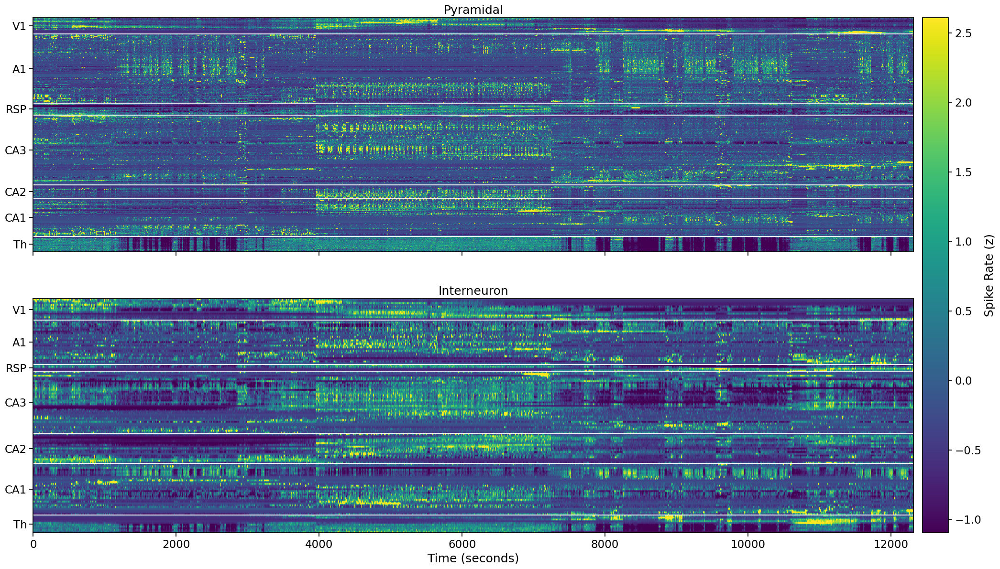

In [6]:
# -----------------------------
# 3) Plot: one heatmap per celltype
# -----------------------------
celltype_order = list(cell_type_groups.keys())  # e.g., ["Pyramidal", "Interneuron"]
n_rows = len(celltype_order)

fig, axs = plt.subplots(
    n_rows, 1,
    figsize=(25, 7 * n_rows),
    sharex=True,
    squeeze=False
)

first_im = None
visible_axes = []

for i, celltype_key in enumerate(celltype_order):
    ax = axs[i, 0]
    M_concat = concat_by_celltype[celltype_key]

    if M_concat is None or M_concat.size == 0:
        ax.set_visible(False)
        continue

    im = ax.imshow(
        M_concat,
        aspect='auto',
        cmap='viridis',
        extent=[time_bins[0], time_bins[-1], 0, M_concat.shape[0]],
        vmin=vmin,
        vmax=vmax,
        origin='lower'
    )
    if first_im is None:
        first_im = im
    visible_axes.append(ax)

    # --- Draw region separators and centered labels ---
    sections = sections_by_celltype[celltype_key]
    ytick_positions = []
    ytick_labels = []

    for (region_name, start_row, end_row) in sections:
        # Separator line at the top of each region except the first
        if start_row > 0:
            ax.axhline(y=start_row, color='white', linewidth=1.5, alpha=0.9)
        # Center position for label
        center = 0.5 * (start_row + end_row)

        ytick_positions.append(center)
        ytick_labels.append(region_name)

    # Add a bottom boundary line for the last region
    if sections:
        ax.axhline(y=sections[-1][2], color='white', linewidth=1.5, alpha=0.9)

    ax.set_yticks(ytick_positions)
    ax.set_yticklabels(ytick_labels)
    #ax.set_ylabel(f"{celltype_key}\n")

    # Title per heatmap
    ax.set_title(f"{celltype_key}")

# Shared x label
axs[-1, 0].set_xlabel("Time (seconds)")

# Single shared colorbar
if first_im is not None:
    cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.04, pad=0.01)
    cbar.set_label("Spike Rate (z)")


#plt.savefig("firing_rates.png", dpi=300)

plt.show()



## Extracting the position tracking data 

Number of TTLs: 393621
Number of frames: 393557
Trimming TTLs from 393621 to 393557
Tracking start time: 3960.955 s, end time: 7240.426 s, duration: 3279.471 s


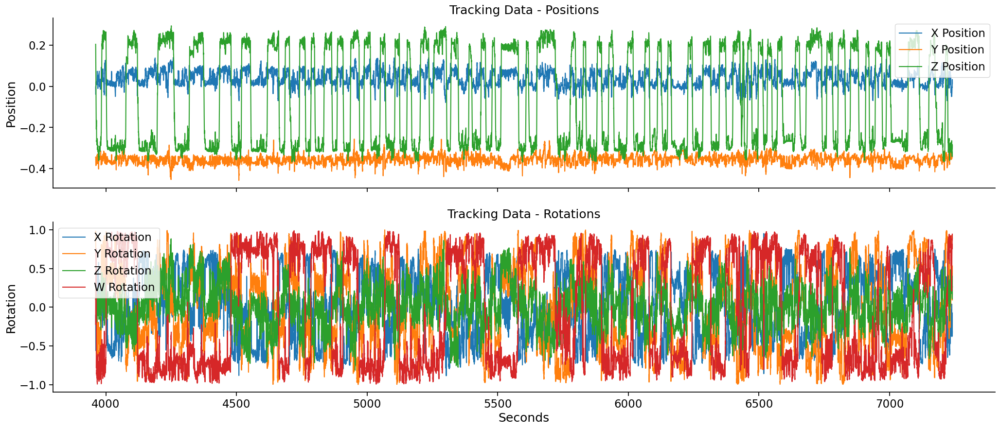

In [7]:
# Loadding in the TTLs
ttl_file = os.path.join(DATA_DIR, 'preprocessing_output', f'supercat_{SESSION_NAME}', f'{SESSION_NAME}_tcat.obx0.obx.xd_8_12_0.txt')
ttls = np.loadtxt(ttl_file)
print(f"Number of TTLs: {len(ttls)}")

# Loadding in the tracking data
tracking_file = os.path.join(DATA_DIR, "linear_maze_20250212.csv")
tracking_data = np.genfromtxt(tracking_file, delimiter=",", skip_header=7)
frames = tracking_data[:,0]
print(f'Number of frames: {len(frames)}')


# Sometimes there are a few more frames after the last TTL or more TTLs than frames. We will trim the data to the shortest length.
if len(frames) < len(ttls):
    print(f'Trimming TTLs from {len(ttls)} to {len(frames)}')
    ttls = ttls[:len(frames)]
    tracking_data = tracking_data[:len(frames),:]
elif len(frames) > len(ttls):
    print(f'Trimming frames from {len(frames)} to {len(ttls)}')
    frames = frames[:len(ttls)]
    tracking_data = tracking_data[:len(ttls),:]

# printing the start and end times
print(f'Tracking start time: {ttls[0]:.3f} s, end time: {ttls[-1]:.3f} s, duration: {ttls[-1]-ttls[0]:.3f} s')


# fill missing values or nan with linear interpolation
for i in range(tracking_data.shape[1]):
    col = tracking_data[:,i]
    nans = np.isnan(col)
    if np.any(nans):
        not_nans = ~nans
        interp_func_col = interp1d(frames[not_nans], col[not_nans], bounds_error=False, fill_value="extrapolate")
        col[nans] = interp_func_col(frames[nans])
        tracking_data[:,i] = col

# extract x, y, z positions and rotations
x_rotations = tracking_data[:,2]
y_rotations = tracking_data[:,3]
z_rotations = tracking_data[:,4]
w_rotations = tracking_data[:,5]
x_positions = tracking_data[:,6]
y_positions = tracking_data[:,7]
z_positions = tracking_data[:,8]

# Plotting the tracking data
fig, axs = plt.subplots(2, 1, figsize=(25,10), sharex=True)

sns.lineplot(ax=axs[0], x=ttls, y=x_positions, label='X Position')
sns.lineplot(ax=axs[0], x=ttls, y=y_positions, label='Y Position')
sns.lineplot(ax=axs[0], x=ttls, y=z_positions, label='Z Position')
axs[0].set_ylabel('Position')
axs[0].set_title('Tracking Data - Positions')

sns.lineplot(ax=axs[1], x=ttls, y=x_rotations, label='X Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=y_rotations, label='Y Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=z_rotations, label='Z Rotation')
sns.lineplot(ax=axs[1], x=ttls, y=w_rotations, label='W Rotation')
axs[1].set_xlabel('Seconds')
axs[1].set_ylabel('Rotation')
axs[1].set_title('Tracking Data - Rotations')
sns.despine()
plt.show()


In [8]:
# choose which position to use
pos_raw = z_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]

# compute the velocity
velocity = np.gradient(pos_raw) / np.gradient(ttls)  # velocity in m/s

# getting the running direction
running_direction = np.sign(velocity)

# getting the speed
speed = np.abs(velocity)  # speed in m/s

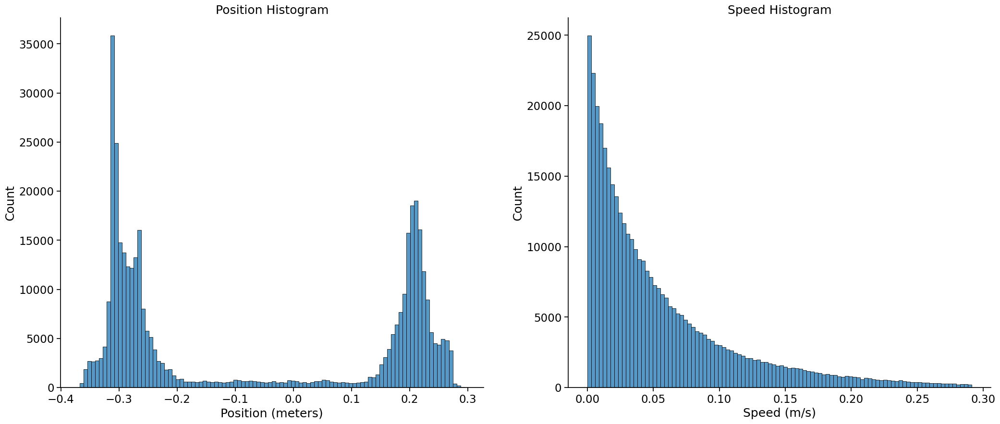

In [9]:
# Plotting some position statistics
fig, axs = plt.subplots(1, 2, figsize=(25,10))
sns.histplot(ax=axs[0], x=pos_raw, bins=100)
axs[0].set_xlabel('Position (meters)')
axs[0].set_ylabel('Count')
axs[0].set_title('Position Histogram')

sns.histplot(ax=axs[1], x=speed[speed < np.percentile(speed, 99)], bins=100)
axs[1].set_xlabel('Speed (m/s)')
axs[1].set_ylabel('Count')
axs[1].set_title('Speed Histogram')
sns.despine()
plt.show()


## Plotting the place fields organized by region

In [10]:
# -----------------------
# Config
# -----------------------
n_spatial_bins = 100
pos_min, pos_max = -0.36, 0.3
speed_threshold = 0.05  # m/s
regions_of_interest = ['Th', 'CA1', 'CA2', 'CA3', 'RSP', 'A1', 'V1']
cell_type_groups = {
    'Pyramidal':   ['Pyramidal Cell'],
    'Interneuron': ['Narrow Interneuron', 'Wide Interneuron'],
}
sort_by = 'peak'



# computing the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

pos_interp_func = interp1d(ttls, pos_raw, bounds_error=False, fill_value=np.nan)

# -----------------------
# Precompute per-probe masks and occupancy
# -----------------------
probe_data = {}  # probe -> dict with masks, idx, denom, tb_m, pos_m, spike_rates_m
for probe in PROBES:
    for d in [-1, 0, 1]:
        spike_rate_matrix, tb, units = spike_rate_matrices[probe]  # (n_units, n_timebins)
        ct_probe = np.asarray(cell_types[probe])                    # len == n_units

        # Interpolate position to this probe’s time grid
        pos_probe = pos_interp_func(tb)

        # TTL crop
        start_time, end_time = np.min(ttls), np.max(ttls)
        valid_time = (tb >= start_time) & (tb <= end_time)

        fr = spike_rate_matrix[:, valid_time]
        tb_crop = tb[valid_time]
        pos_crop = pos_probe[valid_time]

        # Direction mask (per timepoint)
        vel = np.gradient(pos_crop, tb_crop)
        direction = np.sign(vel)
        if d == 0:
            direction_mask = np.ones_like(direction, dtype=bool)
        else:
            direction_mask = direction == d

        pos_crop = pos_crop[direction_mask]
        fr = fr[:, direction_mask]
        tb_crop = tb_crop[direction_mask]

        # Drop NaN position samples
        ok = ~np.isnan(pos_crop)
        if ok.sum() == 0:
            print(f"Probe {probe}: no valid samples after TTL/position masking.")
            probe_data[probe] = None
            continue

        fr = fr[:, ok]
        pos_crop = pos_crop[ok]
        tb_crop = tb_crop[ok]

        # Speed (smoothed) and moving-mask
        # gradient(pos, time) already gives velocity (m/s)
        speed = np.abs(np.gradient(pos_crop, tb_crop))
        speed = gaussian_filter1d(speed, sigma=3)

        move = speed > speed_threshold
        if move.sum() == 0:
            print(f"Probe {probe}: no samples exceed speed threshold ({speed_threshold} m/s).")
            probe_data[probe] = None
            continue

        # Apply moving mask
        fr_m   = fr[:, move]
        pos_m  = pos_crop[move]
        tb_m   = tb_crop[move]

        # Bin positions for this probe
        idx = np.digitize(pos_m, bin_edges, right=True)
        idx = np.clip(idx, 0, n_spatial_bins - 1)

        # Occupancy (counts per spatial bin) for this probe
        denom = np.bincount(idx, minlength=n_spatial_bins).astype(float)
        if denom.sum() == 0:
            print(f"Probe {probe}: zero occupancy across all bins.")
            probe_data[probe] = None
            continue

        probe_data[probe, d] = dict(
            fr_m=fr_m, tb_m=tb_m, pos_m=pos_m, idx=idx, denom=denom, ct=ct_probe
        )

# -----------------------
# Build per-(region, celltype) lists of place fields across probes
# -----------------------
panel_pfs = {}  # (row_key, col_key) -> list of 1D PF arrays
row_keys = ['Pyramidal', 'Interneuron']
col_keys = list(regions_of_interest)

# Helper to compute one unit's PF using its probe's occupancy
def unit_place_field(fr_unit, idx, denom):
    # weighted average rate per bin: sum(fr at timepoints in bin) / occupancy
    num = np.bincount(idx, weights=fr_unit, minlength=n_spatial_bins).astype(float)
    pf = np.divide(num, denom, out=np.zeros_like(num), where=(denom > 0))
    return pf

for d in [-1, 0, 1]:
    for rkey in row_keys:
        for ckey in col_keys:
            panel_pfs[(rkey, ckey, d)] = []

# We need unit-level region labels; `regions[probe]` already holds region per unit (after your earlier mask)
for probe in PROBES:
    rgn_arr = regions[probe]  # (n_units_probe,)
    for d in [-1, 0, 1]:
        pdata = probe_data.get((probe, d), None)
        if pdata is None:
            continue

        fr_m   = pdata['fr_m']       # (n_units_probe, n_timepoints_after_masks)
        idx    = pdata['idx']        # (n_timepoints_after_masks,)
        denom  = pdata['denom']      # (n_spatial_bins,)
        ct_arr = pdata['ct']         # (n_units_probe,)
        rgn_arr = regions[probe]     # (n_units_probe,) region name per unit
        

        for rkey in row_keys:
            allowed_ct = set(cell_type_groups[rkey])
            for ckey in col_keys:

                # Select units that are (this region, this cell-type, this direction)
                unit_sel = np.where((np.isin(ct_arr, list(allowed_ct))) & (rgn_arr == ckey))[0]
                if unit_sel.size == 0:
                    continue

                # Compute PF per selected unit and append
                for u in unit_sel:
                    pf = unit_place_field(fr_m[u, :], idx, denom)
                    panel_pfs[(rkey, ckey, d)].append(pf)

# -----------------------
# Prepare matrices & global color scale
# -----------------------
panel_mats = {}  # (row_key, col_key) -> 2D array (n_units, n_bins) or None
all_vals = []
for d in [-1, 0, 1]:
    for rkey in row_keys:
        for ckey in col_keys:
            pf_list = panel_pfs[(rkey, ckey, d)]
            if len(pf_list) == 0:
                panel_mats[(rkey, ckey, d)] = None
                continue
            M = np.vstack(pf_list)  # (n_units_in_panel, n_spatial_bins)

            # Sort units by peak bin (descending so earlier peaks at top if you prefer)
            order = np.argsort(np.argmax(M, axis=1))[::-1]
            M = M[order, :]

            panel_mats[(rkey, ckey, d)] = M
            all_vals.append(M.ravel())

if len(all_vals) == 0:
    raise RuntimeError("No units found for the chosen regions/cell types after masking and binning.")

all_vals = np.concatenate(all_vals)
vmin = np.percentile(all_vals, 2.5)
vmax = np.percentile(all_vals, 97.5)
if vmin == vmax:
    vmax = vmin + 1e-12

    


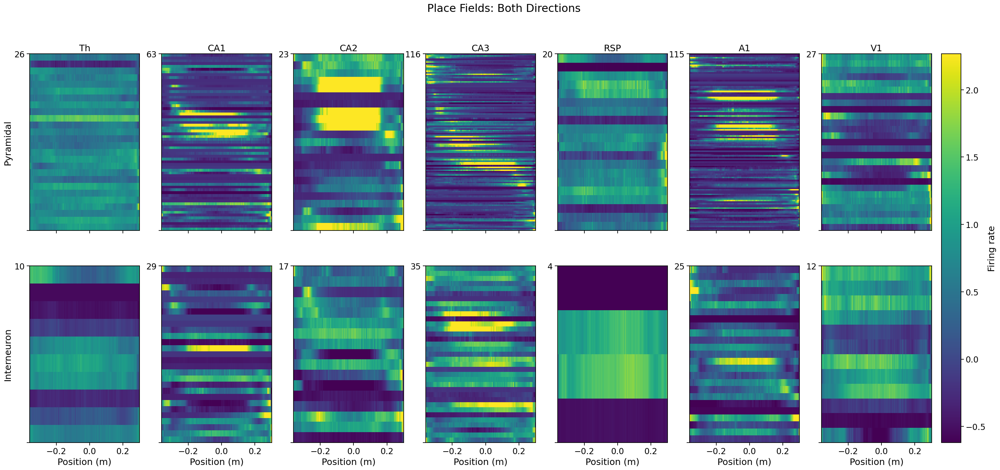

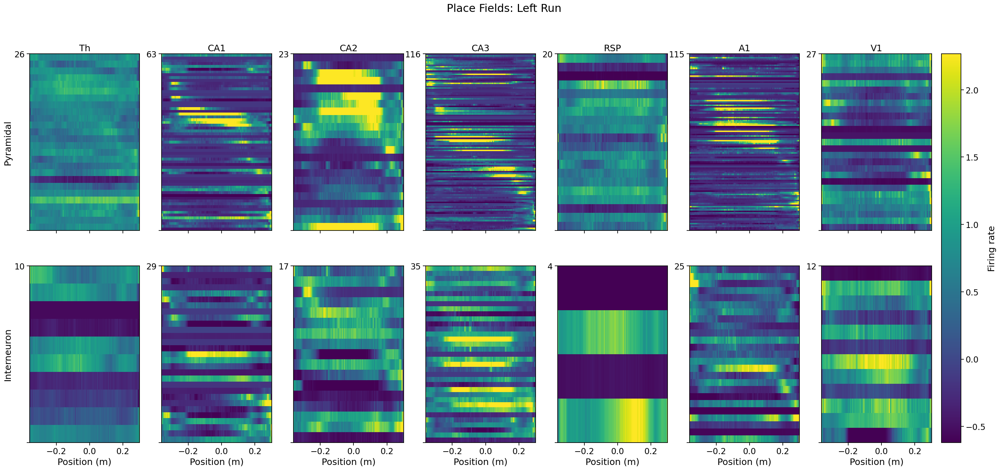

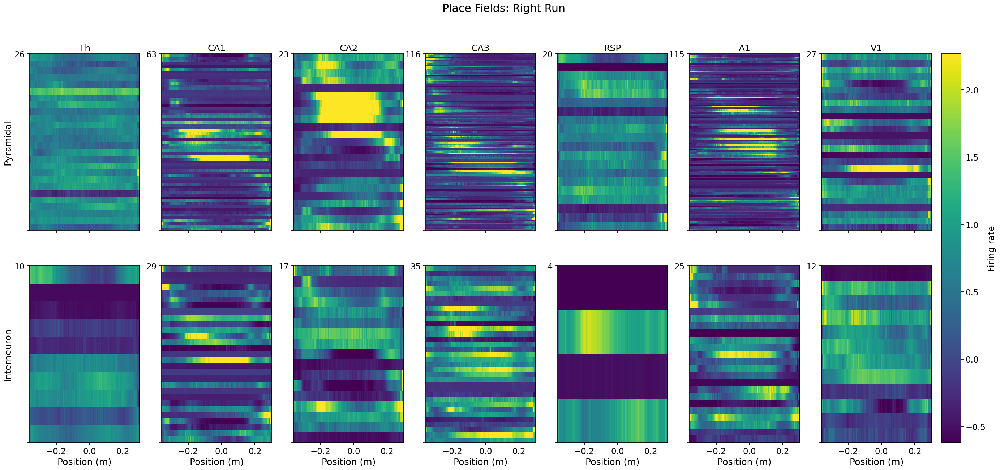

In [11]:

# -----------------------
# Plot
# -----------------------
for direction in [0, -1, 1]:
    n_rows, n_cols = len(row_keys), len(col_keys)
    fig, axs = plt.subplots(
        n_rows, n_cols,
        figsize=(5 * n_cols, 7 * n_rows),
        sharex=True,
        squeeze=False
    )

    first_im = None
    visible_axes = []

    for i, rkey in enumerate(row_keys):
        for j, ckey in enumerate(col_keys):
            ax = axs[i, j]
            M = panel_mats[(rkey, ckey, direction)]
            if M is None or M.size == 0:
                ax.set_visible(False)
                continue

            im = ax.imshow(
                M,
                aspect='auto',
                cmap='viridis',
                extent=[bin_edges[0], bin_edges[-1], 0, M.shape[0]],
                vmin=vmin, vmax=vmax,
                origin='lower'
            )


            


            #ax.yaxis.set_major_locator(ticker.MaxNLocator(integer=True))
            ax.set_yticks([0, M.shape[0]], labels=['', f'{M.shape[0]}'])

            if first_im is None:
                first_im = im
            visible_axes.append(ax)

            title_txt = f"{ckey}"
            if i == 0:
                ax.set_title(title_txt)
            else:
                ax.set_title("")
            ax.set_ylabel("Units")
            if i == n_rows - 1:
                ax.set_xlabel("Position (m)")
            if j == 0:
                ax.set_ylabel(f"{rkey}")
            else:
                ax.set_ylabel("")

    # Shared colorbar
    if first_im is not None and len(visible_axes) > 0:
        cbar = fig.colorbar(first_im, ax=visible_axes, orientation='vertical', fraction=0.07, pad=0.01)
        cbar.set_label("Firing rate")

    plt.suptitle(f"Place Fields: {'Right Run' if direction == 1 else 'Left Run' if direction == -1 else 'Both Directions'}")
    plt.show()


In [ ]:
# save place fields line plots
output_dir = os.path.join(DATA_DIR, f'place_fields_window_size_{WINDOW_SIZE}_bins_{n_spatial_bins}')
os.makedirs(output_dir, exist_ok=True)

for (rkey, ckey), M in panel_mats.items():
    if M is None or M.size == 0:
        continue
    n_units = M.shape[0]
    for unit_idx in range(n_units):
        pf = M[unit_idx, :]
        plt.figure(figsize=(15,8))
        sns.lineplot(x = 0.5 * (bin_edges[:-1] + bin_edges[1:]), y = pf, linewidth=4)
        plt.title(f'Region: {ckey} — Cell type: {rkey} — Unit {unit_idx}')
        plt.xlabel('Position (m)')
        plt.ylabel('Firing Rate (Hz)')
        sns.despine()
        plot_file_path = os.path.join(output_dir, f'region_{ckey}', f'celltype_{rkey}')
        os.makedirs(plot_file_path, exist_ok=True)
        plot_filename = os.path.join(plot_file_path, f'unit{unit_idx}.png')
        plt.savefig(plot_filename)
        plt.close()

## Bayesian decoding of position from spiking activity

In [17]:
# ---- Baysian decoding configuration ----
use_regions = ['CA1', 'CA2', 'CA3']
use_unit_types = ['Pyramidal Cell', 'Narrow Interneuron', 'Wide Interneuron']
use_unit_types = ['Pyramidal Cell']
n_spatial_bins = 20
pos_min, pos_max = -0.36, 0.3
speed_threshold = 0.05  # m/s

# compute the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

# choose which position to use
pos_raw = z_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]


# Creating interpolation function for position
pos_interp_func = interp1d(ttls, pos_raw, kind = 'linear', bounds_error=False, fill_value=np.nan)

# getting reference time from probe with shortest timebins
tb_ref = None
for probe in PROBES:
    _, tb_probe, _ = spike_rate_matrices[probe]
    if tb_ref is None:
        tb_ref = tb_probe
    elif len(tb_probe) < len(tb_ref):
        tb_ref = tb_probe


# Build canonical masks on the *reference* tb_ref
pos_ref = pos_interp_func(tb_ref)
valid_ttl  = (tb_ref >= np.min(ttls)) & (tb_ref <= np.max(ttls))
finite_pos = np.isfinite(pos_ref)

if speed_threshold > 0:
    vel_ref   = np.gradient(pos_ref, tb_ref)
    speed_ref = gaussian_filter1d(np.abs(vel_ref), sigma=1)
    move_mask = speed_ref > speed_threshold
else:
    move_mask = np.ones_like(tb_ref, dtype=bool)

canon_mask = valid_ttl & finite_pos & move_mask
time_bins  = tb_ref[canon_mask]

# Targets (clip AFTER masking)
pos_canon = pos_ref[canon_mask]
pos_idx   = np.digitize(pos_canon, bin_edges, right=True)
pos_idx   = np.clip(pos_idx, 0, n_spatial_bins - 1)

speed = speed_ref[canon_mask]



# getting the spike rates for the selected regions
selected_spike_rates = []
for probe in PROBES:


    spike_rate_matrix, probe_times, units = spike_rate_matrices[probe]  # (n_units, n_timebins)


    # cropping probe_times to match reference timebins
    if len(probe_times) != len(tb_ref):
        print(f'Probe {probe} timebins length {len(probe_times)} does not match reference timebins length {len(tb_ref)}')
        # cropping the probe times to match the reference timebins
        start_time, end_time = np.min(tb_ref), np.max(tb_ref)
        valid_time_probe = (probe_times >= start_time) & (probe_times <= end_time)
        # check if all time values are now equal
        probe_times = probe_times[valid_time_probe]
        spike_rate_matrix = spike_rate_matrix[:, valid_time_probe]
        
        if np.allclose(probe_times, tb_ref, rtol=0, atol=1e-9):
            print(f'Probe {probe} timebins successfully matched to reference timebins after cropping.')
            print(f'sum of differences: {np.sum(probe_times - tb_ref)}\n')
        else:
            raise ValueError(f'Probe {probe} timebins do not match reference timebins after cropping. Lengths: {len(probe_times)} vs {len(tb)}')


    # filtering out timebins outside the TTL range and speed threshold
    spike_rate_matrix = spike_rate_matrix[:, canon_mask]


    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    rgn_arr = regions[probe]                                   # len == n_units

    # select units from the selected regions
    unit_sel = np.where(
        (np.isin(ct_probe, use_unit_types)) &
        (np.isin(rgn_arr, use_regions))
    )[0]
    if unit_sel.size == 0:
        continue

    selected_spike_rates.append(spike_rate_matrix[unit_sel, :])

# concatenating the selected spike rates across probes
if len(selected_spike_rates) == 0:
    raise RuntimeError("No units found for the chosen regions after filtering.")
spike_rates_concat = np.vstack(selected_spike_rates)  # shape: (n_units_selected, n_timebins)

# sort the units based on correlation
spike_rates_concat = sort_units(spike_rates_concat, mode='corr')
vmin = np.percentile(spike_rates_concat, 2.5)
vmax = np.percentile(spike_rates_concat, 97.5)



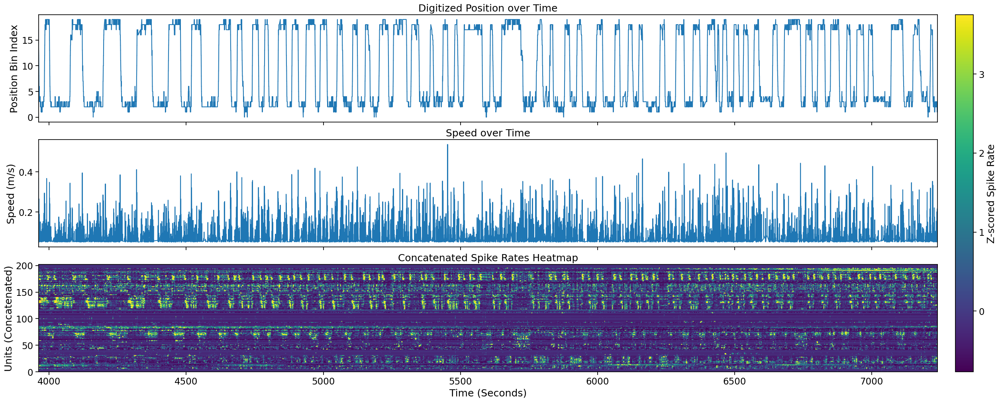

In [18]:
# plotting the digitized positions and the spike rates

dt = np.median(np.diff(time_bins))
n_units = spike_rates_concat.shape[0]
xmin = time_bins[0] - 0.5*dt
xmax = time_bins[-1] + 0.5*dt

fig, axs = plt.subplots(3, 1, figsize=(25, 10), sharex=True, constrained_layout=True)

# Top: line
axs[1].plot(time_bins, speed)
axs[1].set_ylabel('Speed (m/s)')
axs[1].set_title('Speed over Time')
axs[0].plot(time_bins, pos_idx)
axs[0].set_ylabel('Position Bin Index')
axs[0].set_title('Digitized Position over Time')

# Bottom: heatmap with true x via extent
im = axs[2].imshow(
    spike_rates_concat, aspect='auto', origin='lower',
    extent=[xmin, xmax, 0, n_units],
    vmin=vmin, vmax=vmax, cmap='viridis'
)

# Force identical x-lims on both axes
for ax in axs:
    ax.set_xlim(xmin, xmax)

# Colorbar attached to BOTH axes so layout stays symmetric
cbar = fig.colorbar(im, ax=axs, location='right', fraction=0.02, pad=0.02)
cbar.set_label('Z-scored Spike Rate')

axs[2].set_xlabel('Time (Seconds)')
axs[2].set_ylabel('Units (Concatenated)')
axs[2].set_title('Concatenated Spike Rates Heatmap')

plt.show()

### Sanity check: behavior/neural alignment

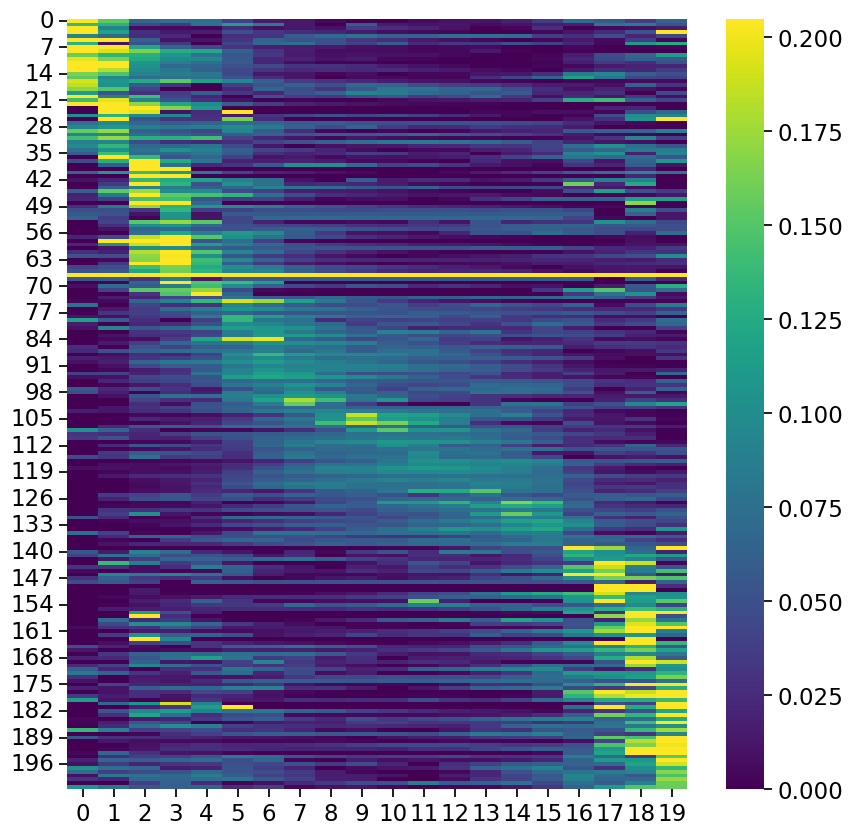

In [ ]:

denom = np.bincount(pos_idx, minlength=n_spatial_bins).astype(float)
pfs = []
pfs.append(denom)
for unit in range(spike_rates_concat.shape[0]):
    pf = unit_place_field(spike_rates_concat[unit, :], pos_idx, denom)

    if True:
        min = np.min(pf)
        pf = pf - min  # shift to non-negative
        sum = np.sum(pf)
        if sum > 0:
            pf = pf / sum
        else:
            pf = pf * 0.0
    pfs.append(pf)

# sort units by peak bin (descending so earlier peaks at top if you prefer)
pfs = np.vstack(pfs)  # (n_units_in_panel, n_spatial_bins)
pfs = sort_units(pfs, mode='peak')
vmin = np.percentile(pfs, 2.5)
vmax = np.percentile(pfs, 97.5)
plt.figure(figsize=(10,10))
sns.heatmap(pfs, cmap='viridis', vmin=vmin, vmax=vmax)
plt.show() 

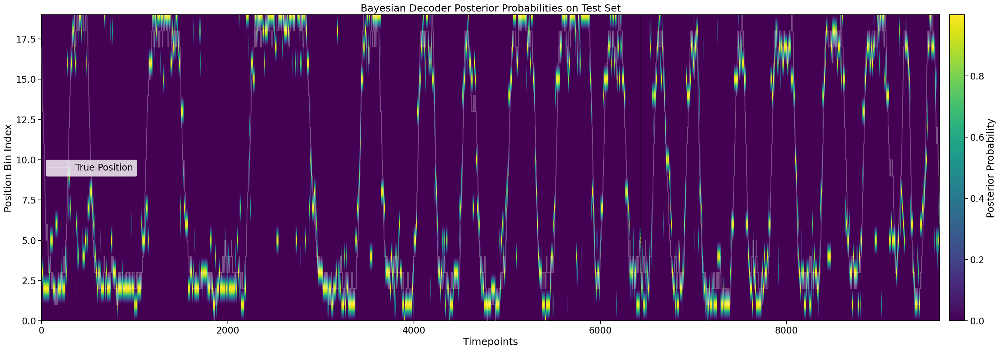

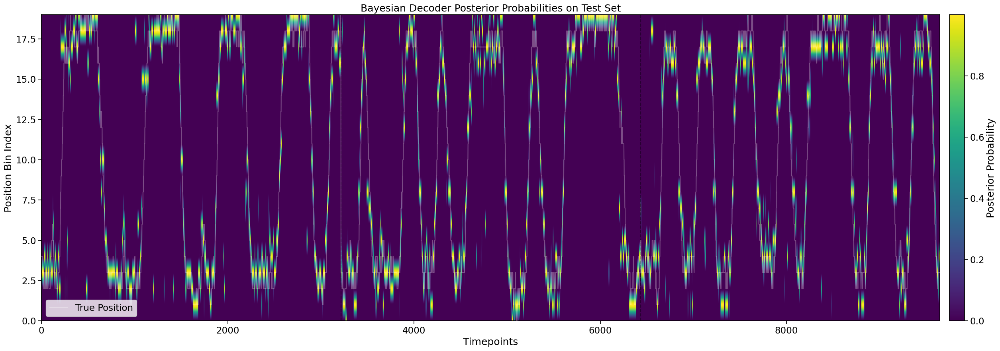

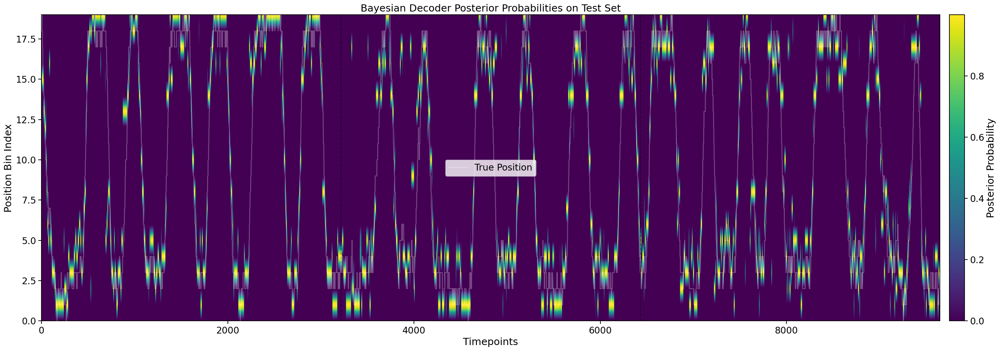

In [20]:
# running the decoder
dataset = DecoderDataset(spike_rates_concat, pos_idx)
decoder = GaussianBayesDecoder(n_bins=n_spatial_bins, var_floor=1e-4, uniform_prior=False)


k_CV = 3
n_blocks = 3

# looping over the cross-validation folds
for k in range(k_CV):

    # split the dataset into training and testing sets
    (X_train, Y_train), (X_test, Y_test), train_switch_ind, test_switch_ind = dataset.split(k=k, k_CV=k_CV, n_blocks=n_blocks)

    # fit the decoder
    decoder.fit(X_train, Y_train)

    # predict on the test set
    log_probs_test = decoder.predict_log_probabilities(X_test)  # shape: (n_bins, n_timepoints)
    log_post = log_probs_test - logsumexp(log_probs_test, axis=0, keepdims=True)  # normalize to get log posterior
    to_plot = np.exp(log_post)  # shape: (n_bins, n_timepoints)
    Y_pred_test = decoder.predict(X_test)  # shape: (n_timepoints,)

    # plot the log_probs heatmap for the test set with the true positions overlaid
    n_timepoints = log_probs_test.shape[1]
    indicies = np.arange(n_timepoints)  # x-axis for plotting

    plt.figure(figsize=(30, 10))
    vmin = np.percentile(to_plot, 2.5)
    vmax = np.percentile(to_plot, 97.5)
    plt.imshow(to_plot, aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    for switch in test_switch_ind:
        plt.axvline(x=switch, color='k', linestyle='--', alpha=0.4)
    plt.plot(indicies, Y_test, color='w', alpha=0.3, label='True Position', zorder=5)
    plt.ylim(0, n_spatial_bins - 1)
    plt.colorbar(label='Posterior Probability', fraction=0.02, pad=0.01)
    plt.xlabel('Timepoints')
    plt.ylabel('Position Bin Index')
    plt.title('Bayesian Decoder Posterior Probabilities on Test Set')
    plt.legend()
    plt.show()

## Training the decoder on the wake period and testing on durring sleep

In [ ]:
# ---- Baysian decoding configuration ----
use_regions = ['Th', 'CA1', 'CA2', 'CA3', 'RSP', 'A1', 'V1']
use_unit_types = ['Pyramidal Cell', 'Narrow Interneuron', 'Wide Interneuron']
n_spatial_bins = 25
pos_min, pos_max = -0.36, 0.
speed_threshold = 0.05  # m/s

# compute the spatial bin edges
bin_edges = np.linspace(pos_min, pos_max, n_spatial_bins + 1)

# choose which position to use
pos_raw = z_positions  # original position samples aligned to `frames` (units: cm)
assert frames.shape[0] == pos_raw.shape[0]

# Creating interpolation function for position
pos_interp_func = interp1d(ttls, pos_raw, kind = 'linear', bounds_error=False, fill_value=np.nan)

# getting the spike rates for the selected regions
selected_spike_rates_wake = []
selected_spike_rates_sleep = []
for probe in PROBES:
    spike_rate_matrix, tb, units = spike_rate_matrices[probe]  # (n_units, n_timebins)

    pos = pos_interp_func(tb)
    pos_idx = np.digitize(pos, bin_edges, right=True)

    # filtering out timebins outside the TTL range
    wake_time = (tb >= np.min(ttls)) & (tb <= np.max(ttls))
    sleep_time = ~wake_time
    transition_point = np.searchsorted(tb, np.min(ttls))

    spike_rate_matrix_wake = spike_rate_matrix[:, wake_time]
    spike_rate_matrix_sleep = spike_rate_matrix[:, sleep_time]
    time_bins_wake = tb[wake_time]
    time_bins_sleep = tb[sleep_time]
    pos_idx = pos_idx[wake_time]

    speed = np.abs(np.gradient(pos[wake_time]) / np.gradient(tb[wake_time]))
    speed = gaussian_filter1d(speed, sigma=1)
    move = speed > speed_threshold
    spike_rate_matrix_wake = spike_rate_matrix_wake[:, move]
    time_bins_wake = time_bins_wake[move]
    pos_idx = pos_idx[move]
    speed = speed[move]


    ct_probe = np.asarray(cell_types[probe])                    # len == n_units
    rgn_arr = regions[probe]                                   # len == n_units

    # select units from the selected regions
    unit_sel = np.where(
        (np.isin(ct_probe, use_unit_types)) &
        (np.isin(rgn_arr, use_regions))
    )[0]
    if unit_sel.size == 0:
        continue

    selected_spike_rates_wake.append(spike_rate_matrix_wake[unit_sel, :])
    selected_spike_rates_sleep.append(spike_rate_matrix_sleep[unit_sel, :])

# concatenating the selected spike rates across probes
if (len(selected_spike_rates_wake) == 0 or len(selected_spike_rates_sleep) == 0):
    raise RuntimeError("No units found for the chosen regions after filtering.")
spike_rates_wake = np.vstack(selected_spike_rates_wake)  # shape: (n_units_selected, n_timebins)
spike_rates_sleep = np.vstack(selected_spike_rates_sleep)  # shape: (n_units_selected, n_timebins)




In [ ]:
decoder = GaussianBayesDecoder(n_bins=n_spatial_bins, var_floor=1e-4, uniform_prior=True)

# split the dataset into training and testing sets
X_train = spike_rates_wake
Y_train = pos_idx
X_test = spike_rates_sleep
Y_test = np.zeros(X_test.shape[1], dtype=int)  # dummy, as we don't have true positions during sleep

print(f"Training set: X_train={X_train.shape}, Y_train={Y_train.shape}")
print(f"Testing set: X_test={X_test.shape}, Y_test={Y_test.shape}")

# fit the decoder
decoder.fit(X_train, Y_train)

# predict on the test set
log_probs_test = decoder.predict_log_probabilities(X_test)  # shape: (n_bins, n_timepoints)
log_post = log_probs_test - logsumexp(log_probs_test, axis=0, keepdims=True)  # normalize to get log posterior
to_plot = np.exp(log_post).astype(np.float32)  # shape: (n_bins, n_timepoints)
Y_pred_test = decoder.predict(X_test)  # shape: (n_timepoints,)



In [ ]:
plot_bins = 20
bin_width = log_probs_test.shape[1] // plot_bins


#loop thorugh plot bins plotting each segment separately
for b in range(plot_bins):
    start = b * bin_width
    end = (b + 1) * bin_width
    plt.figure(figsize=(30,10))
    plt.imshow(to_plot[:, start:end], aspect='auto', origin='lower', cmap='viridis', vmin=vmin, vmax=vmax)
    plt.xticks(ticks=np.linspace(0, bin_width, 5), labels=np.linspace(start, end, 5, dtype=int))
    plt.title(f'Log Probabilities Heatmap (Bin {b+1})')
    plt.xlabel('Time (bins)')
    plt.ylabel('Position Bins')
    plt.colorbar(label='Probability', fraction=0.02, pad=0.01)
    plt.show()
